In [43]:
from PIL import Image, ImageDraw, ImageFile
import pytesseract

import pandas as pd
import numpy as np
import plotly_express as px

from src.backend.plot_box import plot_box, add_rectangle

In [44]:
ImageFile.ImageFile

PIL.ImageFile.ImageFile

In [45]:
print(pytesseract.__version__)

0.3.10


In [46]:
filename = "file.png"
#filename = "file_2.png"

In [47]:
img = Image.open(filename)
type(img)

PIL.PngImagePlugin.PngImageFile

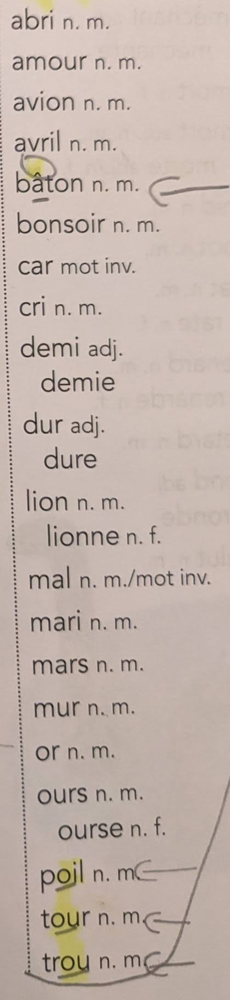

In [48]:
img

In [49]:
import numpy as np
np.array(img).shape

(1814, 418, 3)

In [50]:
img.size

(418, 1814)

In [51]:
print(pytesseract.get_languages(config=''))

['eng', 'fra', 'osd']


In [52]:
out = pytesseract.image_to_string(img, lang='fra')
print(out)

 

abri n. m.
amour n. m.
| avion n. m.
| avril n. m.
: béton n. M. C—
bonsoir n.m.
car mot inv.
Cri n.m.
demi ad).
demie
? dur adi.
dure
lion n.m.
lionne n.f.
mal n. m./mot inv.
mari n.m.
mars n. m.
mur n.m.
Or n. m.

: ours n. m.
! oursen.f.

 



In [54]:
out = pytesseract.image_to_data(img, lang='fra', output_type='data.frame')
df = out.dropna(subset="text")
df

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
4,5,1,1,1,1,1,0,1215,41,78,95,
8,5,1,2,1,1,1,21,0,75,65,96,abri
9,5,1,2,1,1,2,116,33,26,20,90,n.
10,5,1,2,1,1,3,159,33,38,20,46,m.
12,5,1,2,1,2,1,23,102,134,25,90,amour
13,5,1,2,1,2,2,174,106,27,20,88,n.
14,5,1,2,1,2,3,217,105,38,20,88,m.
16,5,1,2,1,3,1,0,187,2,35,89,|
17,5,1,2,1,3,2,25,165,109,36,92,avion
18,5,1,2,1,3,3,154,180,26,20,84,n.


In [59]:
df[df["conf"]>50]

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
4,5,1,1,1,1,1,0,1215,41,78,95,
8,5,1,2,1,1,1,21,0,75,65,96,abri
9,5,1,2,1,1,2,116,33,26,20,90,n.
12,5,1,2,1,2,1,23,102,134,25,90,amour
13,5,1,2,1,2,2,174,106,27,20,88,n.
14,5,1,2,1,2,3,217,105,38,20,88,m.
16,5,1,2,1,3,1,0,187,2,35,89,|
17,5,1,2,1,3,2,25,165,109,36,92,avion
18,5,1,2,1,3,3,154,180,26,20,84,n.
19,5,1,2,1,3,4,197,179,38,20,84,m.


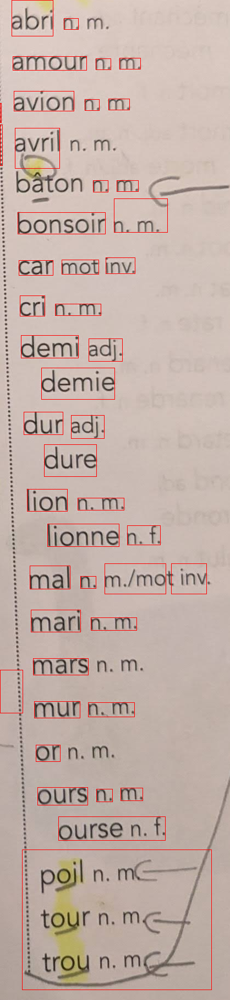

In [61]:
plot_box(img, df[df["conf"]>90])

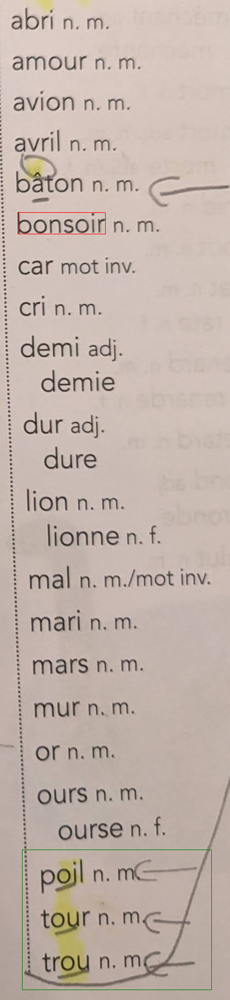

In [24]:
img_b = Image.open(filename)
img1 = ImageDraw.Draw(img_b)
#l, t, w, h = 6, 0, 85, 65 # abri
#l, t, w, h = 10, 283, 133, 88 # baton
l, t, w, h = 32, 385, 159, 39
img1.rectangle([(l, t), (w + l, h + t)], fill=None, outline="red")
#l, t, w, h = 169, 327, 82, 21 # n.m
l, t, w, h = 40, 1541, 344, 254
img1.rectangle([(l, t), (w + l, h + t)], fill=None, outline="green")
img_b.show()

In [26]:
type(img1)

PIL.ImageDraw.ImageDraw

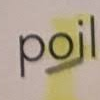

In [12]:
l, t, w, h = 70, 10, 100, 100
img_c = img_b.crop((l, t, w+l, h+t))
img_c

In [15]:
out = pytesseract.image_to_data(img_c, lang='fra')
print(out)

level	page_num	block_num	par_num	line_num	word_num	left	top	width	height	conf	text
1	1	0	0	0	0	0	0	100	100	-1	
2	1	1	0	0	0	19	16	77	61	-1	
3	1	1	1	0	0	19	16	77	61	-1	
4	1	1	1	1	0	19	16	77	61	-1	
5	1	1	1	1	1	19	16	77	61	94	poil



In [20]:
out = pytesseract.image_to_string(img_c, lang='fra')
print(out)

poil



In [45]:
np.array(img_c)[:,:,1]

array([[172, 172, 172, ..., 176, 176, 176],
       [172, 172, 172, ..., 177, 177, 176],
       [172, 172, 172, ..., 177, 177, 177],
       ...,
       [174, 173, 172, ..., 171, 172, 172],
       [173, 173, 171, ..., 171, 172, 172],
       [171, 172, 171, ..., 171, 172, 172]], dtype=uint8)

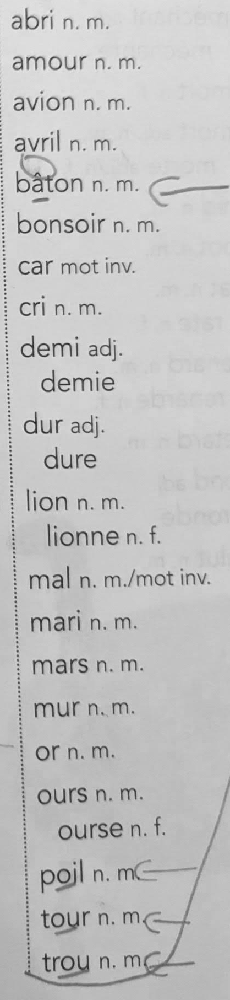

In [232]:
img_b = Image.open(filename)
Image.fromarray(np.array(img_b)[:,:,0])

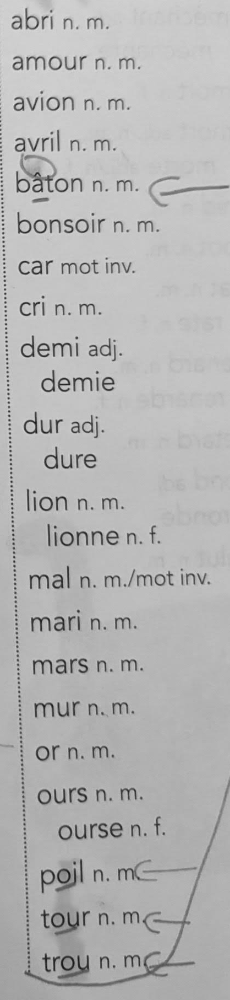

In [233]:
Image.fromarray((np.array(img_b).mean(axis=-1)).astype('uint8'))

In [234]:
b_w_img = np.array(img_b)[:,:,0].astype('uint8')

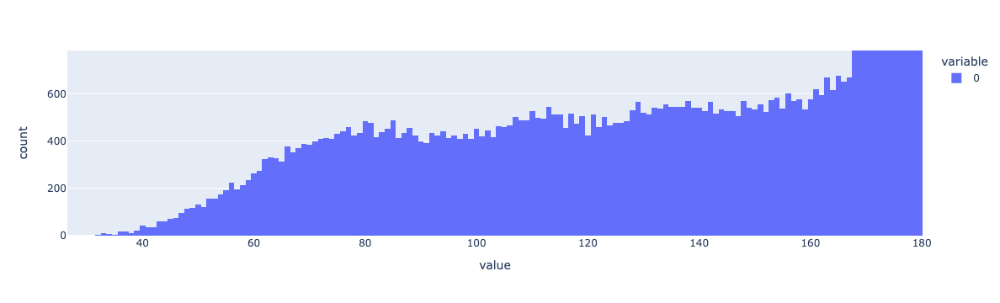

In [235]:
px.histogram(b_w_img.flatten())

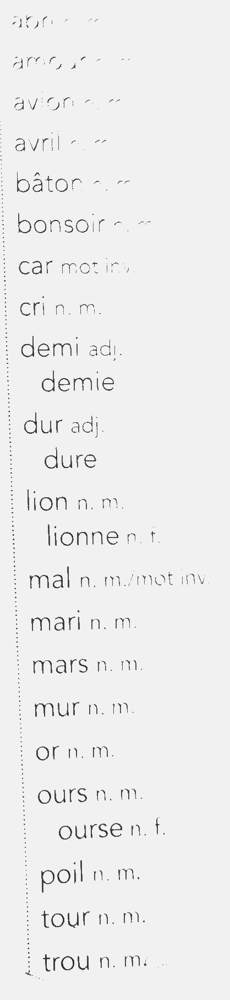

In [248]:
b_w_bin_img = b_w_img.copy()
mask = b_w_img > 94
b_w_bin_img[mask] = np.max(b_w_img)
Image.fromarray(b_w_bin_img)

In [249]:
out = pytesseract.image_to_data(Image.fromarray(b_w_bin_img), lang='fra')
print(out)

level	page_num	block_num	par_num	line_num	word_num	left	top	width	height	conf	text
1	1	0	0	0	0	0	0	418	1814	-1	
2	1	1	0	0	0	0	1097	35	70	-1	
3	1	1	1	0	0	0	1097	35	70	-1	
4	1	1	1	1	0	0	1097	35	70	-1	
5	1	1	1	1	1	0	1097	35	70	95	 
2	1	2	0	0	0	1	28	369	1656	-1	
3	1	2	1	0	0	23	28	100	24	-1	
4	1	2	1	1	0	23	28	100	24	-1	
5	1	2	1	1	1	23	28	72	24	0	A0
5	1	2	1	1	2	119	35	4	2	20	©
3	1	2	2	0	0	1	103	273	701	-1	
4	1	2	2	1	0	24	103	158	23	-1	
5	1	2	2	1	1	24	103	88	23	13	APT)
5	1	2	2	1	2	129	103	27	22	34	at
4	1	2	2	2	0	26	176	138	24	-1	
5	1	2	2	2	1	26	176	107	24	0	avion
4	1	2	2	3	0	1	240	192	51	-1	
5	1	2	2	3	1	28	240	165	34	0	avril.
4	1	2	2	4	0	31	312	205	37	-1	
5	1	2	2	4	1	2	312	146	57	22	 bâtor
5	1	2	2	4	2	171	328	24	18	67	-
5	1	2	2	4	3	214	328	22	6	67	-
4	1	2	2	5	0	33	386	188	37	-1	
5	1	2	2	5	1	33	386	157	37	93	bonsoir
5	1	2	2	5	2	208	402	13	7	73	-.
5	1	2	2	5	3	252	401	22	6	68	—
4	1	2	2	6	0	6	453	228	58	-1	
5	1	2	2	6	1	6	453	4	58	35	-
5	1	2	2	6	2	34	473	61	25	92	car
5	1	2	2	6	3	113	475	121	21	77	